In [151]:
import os
import glob
import nibabel as nib
import numpy as np
import cv2
import math

import matplotlib.pyplot as plt
import plotly.express as px

In [152]:
data_path = '../data/all/VS-1-30'
scan_path = os.path.join(data_path, 'vs_gk_11')

t1_path = glob.glob(os.path.join(scan_path, '*_t1_*'))[0]
t2_path = glob.glob(os.path.join(scan_path, '*_t2_*'))[0]
seg_path = glob.glob(os.path.join(scan_path, '*_seg_*'))[0]
print(t1_path)

../data/all/VS-1-30/vs_gk_11/vs_gk_t1_refT2.nii.gz


In [153]:
t1 = nib.load(t1_path).get_fdata()
t2 = nib.load(t2_path).get_fdata()
seg = nib.load(seg_path).get_fdata()

seg.shape

(448, 448, 80)

In [154]:
seg2 = nib.load(seg_path).get_fdata()
seg2[20:100, 20:100, 20] = 2
seg2[200:400, 20:100, 20] = 3

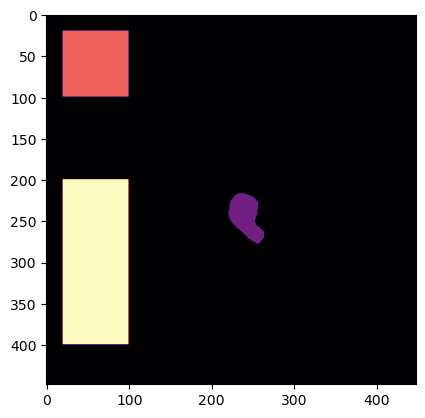

In [155]:
plt.imshow(seg2[:,:,20], cmap='magma')

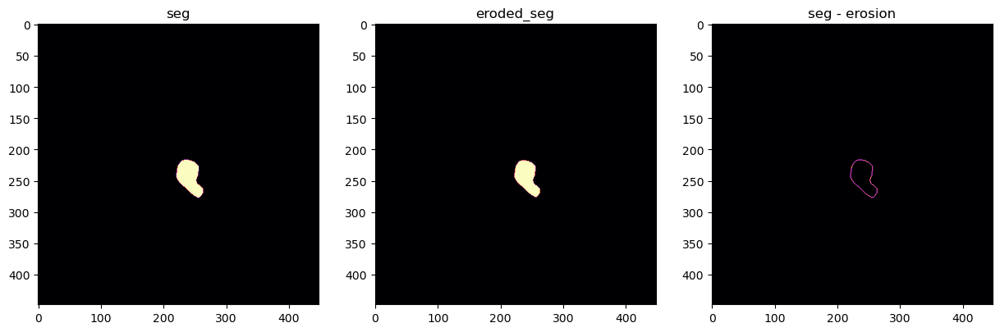

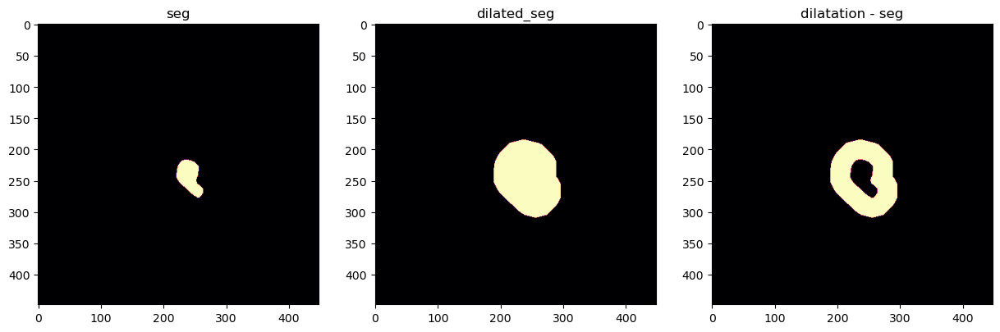

In [156]:
slice = 20

erosion_kernel = cv2.getStructuringElement(shape=cv2.MORPH_ELLIPSE, ksize=(3, 3))
dilatation_kernel = cv2.getStructuringElement(shape=cv2.MORPH_ELLIPSE, ksize=(17, 17))
eroded_seg = cv2.erode(seg[:,:,slice], kernel=erosion_kernel)
dilated_seg = cv2.dilate(seg[:,:,slice], kernel=dilatation_kernel, iterations=4)

diff = seg[:,:,slice] - eroded_seg
diff2 = dilated_seg - seg[:,:,slice]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 10))
ax1.imshow(seg[:,:,slice], cmap = 'magma')
ax1.set_title('seg')
ax2.imshow(eroded_seg, cmap='magma')
ax2.set_title('eroded_seg')
ax3.imshow(diff, cmap='magma')
ax3.set_title('seg - erosion')
plt.show()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 10))
ax1.imshow(seg[:,:,slice], cmap = 'magma')
ax1.set_title('seg')
ax2.imshow(dilated_seg, cmap='magma')
ax2.set_title('dilated_seg')
ax3.imshow(diff2, cmap='magma')
ax3.set_title('dilatation - seg')
plt.show()

In [157]:
border_idx = np.where(diff == 1)
# print(border_idx[0][:10])
# print(border_idx[1][:10])

border_coords = list(zip(*border_idx))
np.random.shuffle(border_coords)
# print(border_coords[:10])

In [158]:
inner_idx = np.where(seg[:,:,slice] == 1)
inner_coords = list(zip(*inner_idx))

# so the clicks are not directly on the edge
inner_coords = list(set(inner_coords) - set(border_coords))
np.random.shuffle(inner_coords)

outer_idx = np.where(diff2 == 1)
outer_coords = list(zip(*outer_idx))
outer_coords = list(set(outer_coords) - set(inner_coords))
np.random.shuffle(outer_coords)

**Border Clicks**

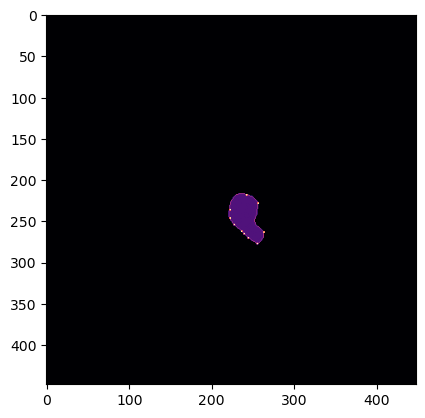

In [159]:
# Border clicks
b = nib.load(seg_path).get_fdata()

for c in border_coords:
    b[c[0], c[1], slice] = 2

for c in border_coords[:10]:
    b[c[0]:c[0]+2, c[1]:c[1]+2, slice] = 4

plt.imshow(b[:,:,slice], cmap='magma')

**Background clicks**

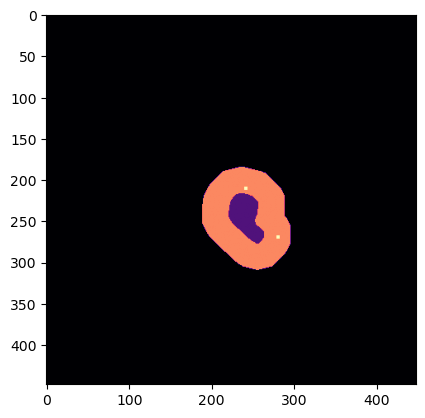

In [160]:
# Background clicks
b = nib.load(seg_path).get_fdata()

for c in outer_coords:
    b[c[0], c[1], slice] = 3

for c in outer_coords[:2]:
    b[c[0]:c[0]+4, c[1]:c[1]+4, slice] = 4

plt.imshow(b[:,:,slice], cmap='magma')

**Foreground clicks**

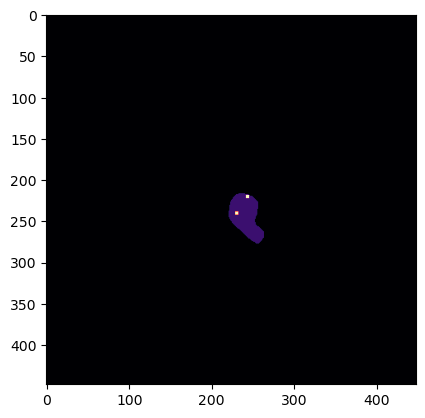

In [161]:
# Foreground clicks
b = nib.load(seg_path).get_fdata()

for c in inner_coords[:2]:
    b[c[0]:c[0]+4, c[1]:c[1]+4, slice] = 5

plt.imshow(b[:,:,slice], cmap='magma')

### Generating clicks

In [162]:
def generate_clicks(coords, n=10, d=30):
    valid_points = []

    coords = np.array(coords)
    np.random.shuffle(coords)
    valid_points.append(coords[0])

    i = 0
    while len(valid_points) != n and i < len(coords):
        new_point = coords[i]

        valid = True
        for p in valid_points:
            dist = np.linalg.norm(p - new_point)
            if dist < d:
                valid = False
                break
            
        if valid:
            valid_points.append(new_point)

        i += 1
            
    
    return valid_points

In [163]:
b = nib.load(seg_path).get_fdata()
valid_points = generate_clicks(coords=border_coords, n=10, d=20)
print(len(valid_points))
valid_points

4


[array([229, 223]), array([259, 259]), array([227, 256]), array([256, 229])]

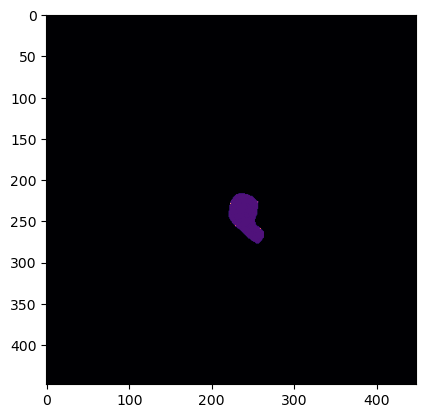

In [164]:
for c in valid_points:
    b[c[0]:c[0]+1, c[1]:c[1]+1, slice] = 4
plt.imshow(b[:,:,slice], cmap='magma')

In [165]:
# testing distance

p1 = np.array(inner_coords[0])
p2 = np.array(inner_coords[1])
print(p1, p2)

d = np.square(p1[0] - p2[0]) + np.square(p1[1] - p2[1])
print(np.sqrt(d))

print(np.linalg.norm(p1 - p2))

[219 242] [239 229]
23.853720883753127
23.853720883753127


In [166]:
outer_clicks = list(zip(*np.where(b[:,:,slice] == 4)))
print(len(outer_clicks))
outer_clicks

4


[(227, 256), (229, 223), (256, 229), (259, 259)]

### More Visualisation

In [167]:
b = nib.load(seg_path).get_fdata()
for c in outer_coords:
    b[c[0], c[1], slice] = 2

In [168]:
for c in inner_coords[:10]:
    b[c[0]:c[0]+2, c[1]:c[1]+2, slice] = 4

In [169]:
fig = px.imshow(b[:,:,slice])
fig.update_coloraxes(
    showscale=False,
    colorscale=[
        (0.0, 'black'),
        (0.25, 'rgb(251, 252, 197)'),
        (0.5, 'rgb(245, 212, 66)'),
        (0.75, 'blue'),
        (1, 'red'),
    ],
)
fig.show()

### Distance transform

In [170]:
import scipy

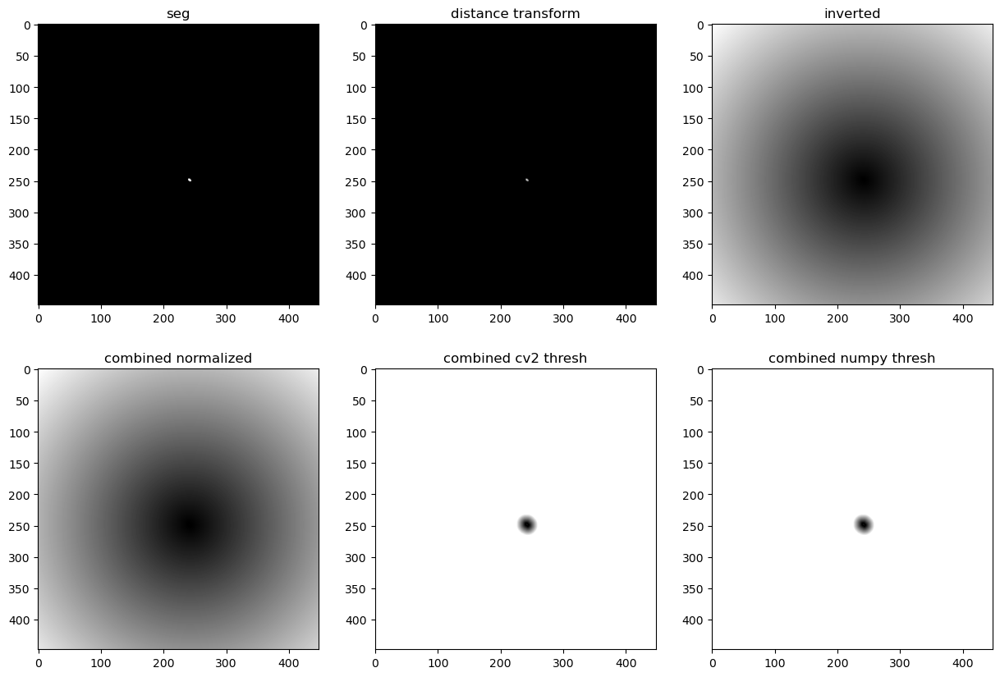

In [199]:
b = nib.load(seg_path).get_fdata()
slice = 11

# dilated_seg = cv2.dilate(seg[:,:,slice], kernel=dilatation_kernel, iterations=4)

# b = np.zeros_like(seg)
# b[:,:,slice] += dilated_seg
# b[140:200, 140:200, slice] = 1

b_dst = cv2.distanceTransform(b[:,:,slice].astype('uint8'), cv2.DIST_L2, 0)
inverted_dst = cv2.distanceTransform(1-b[:,:,slice].astype('uint8'), cv2.DIST_L2, 0)

# works the same in scipy, but without the need to change type
# b_dst = scipy.ndimage.distance_transform_edt(b[:,:,slice])

# in this case the maxval atribute is ingored 
# thresh_val = np.max(b_dst)
thresh_val = 15
threshed = cv2.threshold(b_dst + inverted_dst, thresh=thresh_val, maxval=thresh_val, type=cv2.THRESH_TRUNC)[1]
threshed2 = (b_dst + inverted_dst)
threshed2[threshed2 > thresh_val] = thresh_val

fig, axs = plt.subplots(2, 3, figsize = (15, 10))
axs[0,0].imshow(b[:,:,slice], cmap = 'gray')
axs[0,0].set_title('seg')
axs[0,1].imshow(b_dst, cmap='gray')
axs[0,1].set_title('distance transform')
axs[0,2].imshow(inverted_dst, cmap='gray')
axs[0,2].set_title('inverted')
axs[1,0].imshow(b_dst + inverted_dst/np.max(b_dst), cmap='gray')
axs[1,0].set_title('combined normalized')
axs[1,1].imshow(threshed, cmap='gray')
axs[1,1].set_title('combined cv2 thresh')
axs[1,2].imshow(threshed2, cmap='gray')
axs[1,2].set_title('combined numpy thresh')
plt.show()

In [200]:
np.unique(threshed == threshed2)

array([ True])

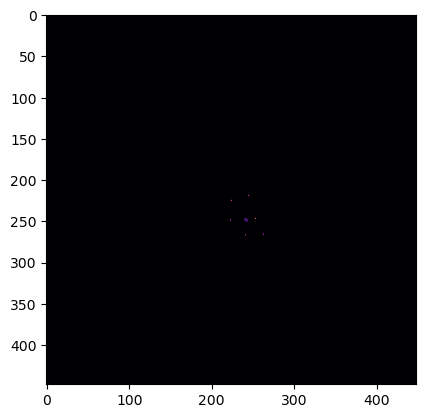

In [201]:
valid_points = generate_clicks(coords=border_coords, n=10, d=20)
for c in valid_points:
    b[c[0], c[1], slice] = 4
plt.imshow(b[:,:,slice], cmap='magma')

In [202]:
clicks_idx = np.where(b[:,:,slice] == 4)
clicks = list(zip(*clicks_idx))
clicks

[(219, 245), (225, 224), (247, 253), (249, 223), (266, 263), (267, 241)]

#### Visualisations

In [203]:
# Normal dst

fig = px.imshow(b_dst)
fig.show()

b_dst[clicks[0]]

0.0

In [204]:
# Combined normalised

fig = px.imshow(b[:,:,slice] + b_dst + inverted_dst/np.max(b_dst))
fig.show()

combined = b_dst + inverted_dst/np.max(b_dst)
combined[clicks[0]]

14.080128

In [205]:
# Combined cv2 threshed

fig = px.imshow(threshed)
fig.show()

threshed[clicks[0]]

15.0

In [206]:
# Normal numpy threshed

fig = px.imshow(threshed2)
fig.show()

threshed2[clicks[0]]

15.0

In [ ]:
# b = nib.load(seg_path).get_fdata()

# erosion_kernel = cv2.getStructuringElement(shape=cv2.MORPH_ELLIPSE, ksize=(3, 3))
# eroded_seg = cv2.erode(b[:,:,slice], kernel=erosion_kernel)

# border = b[:,:,slice] - eroded_seg
# border_dst = cv2.distanceTransform(border.astype('uint8'), cv2.DIST_L2, 0)

# plt.imshow(border_dst, cmap='magma')

### Clicks in 3d

In [ ]:
def get_glioma_indices(mask) -> tuple[int, int]:
    """ Returns the first and last slice indices of the tumour in given mask """

    first = sorted(np.nonzero((mask == 1))[2])[0]
    last = sorted(np.nonzero((mask == 1))[2])[-1]

    return first, last

In [ ]:
def generate_clicks(mask, fg=False, bg=False, click_size=2):
    clicks = {
        'slices': [],
    }

    first, last = get_glioma_indices(mask)

    for slice in range(first, last):
        erosion_kernel = cv2.getStructuringElement(shape=cv2.MORPH_ELLIPSE, ksize=(5, 5))
        dilatation_kernel = cv2.getStructuringElement(shape=cv2.MORPH_ELLIPSE, ksize=(17, 17))
        eroded_seg = cv2.erode(mask[:,:,slice], kernel=erosion_kernel)
        dilated_seg = cv2.dilate(mask[:,:,slice], kernel=dilatation_kernel, iterations=4)

        diff = mask[:,:,slice] - eroded_seg
        diff2 = dilated_seg - mask[:,:,slice]

        border_idx = np.where(diff == 1)
        # print(border_idx[0][:10])
        # print(border_idx[1][:10])

        border_coords = list(zip(*border_idx))
        # print(border_coords[:10])

        # Get fg coordinates
        inner_idx = np.where(mask[:,:,slice] == 1)
        inner_coords = list(zip(*inner_idx))
        inner_coords = list(set(inner_coords) - set(border_coords))
        np.random.shuffle(inner_coords)
        
        # Get bg coordinates
        outer_idx = np.where(diff2 == 1)
        outer_coords = list(zip(*outer_idx))
        outer_coords = list(set(outer_coords) - set(inner_coords))
        np.random.shuffle(outer_coords)


        slice_clicks = {
            'slice': slice,
            'fg_clicks': [],
            'bg_clicks': []
        }

        # Add bg clicks
        if bg:
            for c in outer_coords[:2]:
                slice_clicks['bg_clicks'].append({'y': int(c[0]), 'x': int(c[1])})
                mask[c[0]:c[0]+click_size, c[1]:c[1]+click_size, slice] = 3
        # plt.imshow(b[:,:,slice], cmap='magma')

        # Add fg clicks
        if fg:
            for c in inner_coords[:2]:
                slice_clicks['fg_clicks'].append({'y': int(c[0]), 'x': int(c[1])})
                mask[c[0]:c[0]+click_size, c[1]:c[1]+click_size, slice] = 4
        # plt.imshow(b[:,:,slice], cmap='magma')
    
        clicks['slices'].append(slice_clicks)

    return mask, clicks


In [ ]:
def plot_tumour(mask):
    # Compute number of slices with the tumour
    first, last = get_glioma_indices(mask)
    length = (last-first+1)
    n_graphs = (length)//4
    rows = n_graphs
    cols = 4
    res = cols if cols > rows else rows

    # Plot them
    fig, axs = plt.subplots(rows, cols, figsize=(res*2, res*2))
    axs = axs.flatten()
    j = 0
    for i in range(first, last):
        if j >= len(axs): break
        axs[j].imshow(mask[:,:,i], cmap='magma')
        axs[j].axis('off')
        axs[j].set_title(f'mask slice {i}', fontsize=9)
        j += 1

    plt.show()    

In [ ]:
t1 = nib.load(t1_path).get_fdata()
t2 = nib.load(t2_path).get_fdata()
seg = nib.load(seg_path).get_fdata()

seg.shape

In [ ]:
plot_tumour(seg)

In [ ]:
new_mask, generated_clicks = generate_clicks(seg, fg=True, bg=True)

In [ ]:
plot_tumour(new_mask)

### Distance transform in 3D

In [ ]:
import scipy
import torch

import sys
sys.path.append('../')
from src.data_generator import MRIDataset

In [126]:
def get_glioma_indices(mask) -> tuple[int, int]:
    """ Returns the first and last slice indices of the tumour in given mask """

    first = torch.nonzero((mask >= 1))[:,0][0].item()
    last = torch.nonzero((mask >= 1))[:,0][-1].item()

    return first, last

In [127]:
def plot_tumour(mask):
    # Compute number of slices with the tumour
    first, last = get_glioma_indices(mask)
    print(first, last)
    
    length = (last-first+1)
    n_graphs = (length)//4
    rows = n_graphs
    cols = 4
    res = cols if cols > rows else rows

    # Plot them
    fig, axs = plt.subplots(rows, cols, figsize=(res*2, res*2))
    axs = axs.flatten()
    j = 0
    for i in range(first, last):
        if j >= len(axs): break
        axs[j].imshow(mask[i,:,:], cmap='magma')
        axs[j].axis('off')
        axs[j].set_title(f'mask slice {i}', fontsize=9)
        j += 1

    plt.show()    

In [128]:
clicks_dataset = MRIDataset(
    [t1_path], [t2_path], [seg_path],
    (40, 80, 80),
    clicks = {
        'use': True,
        'gen_fg': False,
        'gen_bg': False,
        'gen_border': True,
        'num': 20,
        'size': 1
    }
)

gt_dataset = MRIDataset(
    [t1_path], [t2_path], [seg_path],
    (40, 80, 80),
)

In [196]:
img, click_label = clicks_dataset[0]
click_label[0].permute(1, 2, 0).shape

torch.Size([80, 80, 40])

In [197]:
img, gt_label = gt_dataset[0]
torch.unique(gt_label)

tensor([0., 1.])

11 27


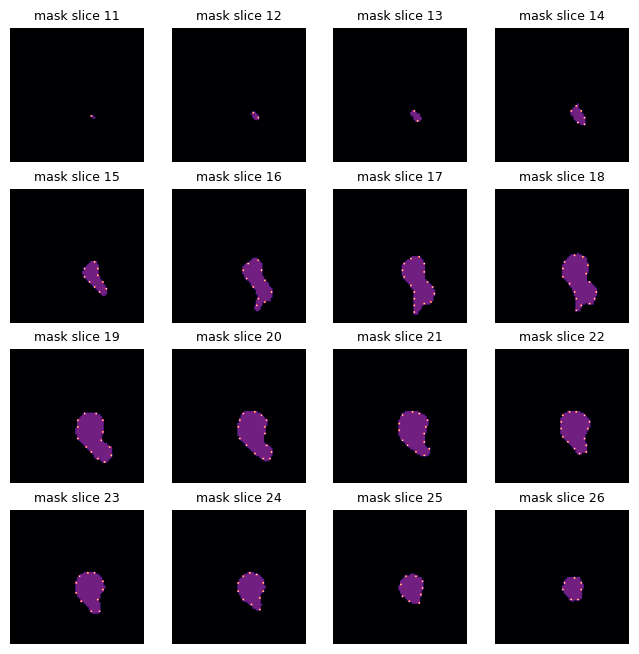

In [198]:
plot_tumour(gt_label[0] + click_label[0])

In [191]:
# b = nib.load(seg_path).get_fdata()
# b = np.expand_dims(b, 0)
# b = np.stack([b, b], axis=0)
# print(b.shape)

first, last = get_glioma_indices(gt_label[0])
print(first, last)

combined = torch.zeros_like(gt_label)

b_dst = torch.as_tensor(scipy.ndimage.distance_transform_edt(gt_label[0,first:last+1,:,:]))
inverted_dst = torch.as_tensor(scipy.ndimage.distance_transform_edt(1-gt_label[0,first:last+1,:,:]))
print(type(gt_label), type(b_dst))
print(b_dst.shape)

combined[:,first:last+1,:,:] = b_dst + inverted_dst
print(combined.shape)

11 27
<class 'torch.Tensor'> <class 'torch.Tensor'>
torch.Size([17, 80, 80])
torch.Size([1, 40, 80, 80])


In [192]:
# in this case the maxval atribute is ingored 
thresh_val = torch.max(b_dst)
print(torch.max(b_dst))

# thresh_val = 15
threshed2 = combined
threshed2[threshed2 > thresh_val] = thresh_val

# print(np.max(threshed))

tensor(6.6332, dtype=torch.float64)


In [193]:
threshed2.shape

torch.Size([1, 40, 80, 80])

In [194]:
torch.unique(threshed2[0,39,:,:])

tensor([0.])

11 27


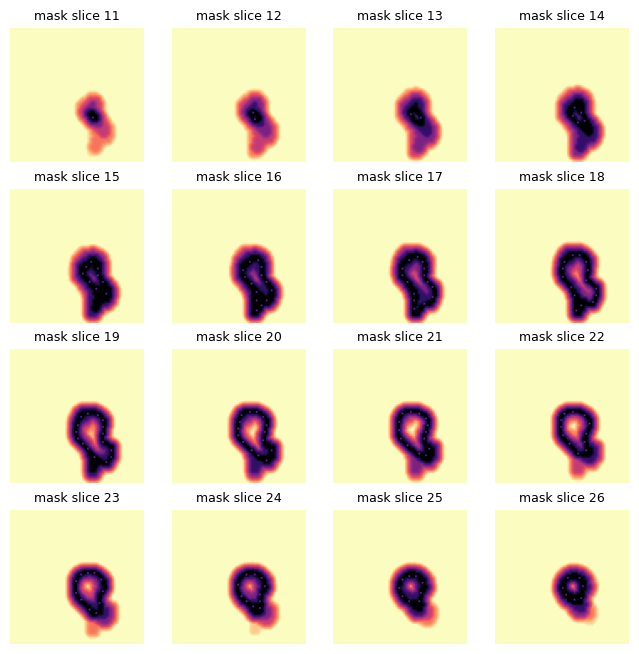

In [195]:
plot_tumour(threshed2[0] + click_label[0])

### Serializing clicks

In [ ]:
clicks = {
    'images': [
        {
            'image': seg_path,
            'clicks': generated_clicks
        }
    ]
}

In [ ]:
import json

In [ ]:
with open('clicks.json', 'w') as f:
    json.dump(clicks, f)

In [ ]:
slice = clicks['slices'][6]['slice']
x = clicks['slices'][1]['fg_clicks'][0]['x']
y = clicks['slices'][1]['fg_clicks'][0]['y']
print(slice, x, y)

In [ ]:
fig = px.imshow(seg[x-10:x+10, y-10:y+10, slice])
fig.update_coloraxes(
    showscale=False,
    colorscale=[
        (0.0, 'black'),
        (0.25, 'rgb(251, 252, 197)'),
        (0.5, 'rgb(245, 212, 66)'),
        (0.75, 'blue'),
        (1, 'red'),
    ],
)
fig.show()

In [ ]:
fig = px.imshow(seg[:, :, slice])
fig.update_coloraxes(
    showscale=False,
    colorscale=[
        (0.0, 'black'),
        (0.25, 'rgb(251, 252, 197)'),
        (0.5, 'rgb(245, 212, 66)'),
        (0.75, 'blue'),
        (1, 'red'),
    ],
)
fig.show()

In [ ]:
seg_list = sorted(glob.glob(os.path.join('../data/all/', 'VS-*-*/vs_*/*_seg_*')))
len(seg_list)

for seg_path in seg_list:
    seg = nib.load(seg_path).get_fdata()
    new_mask, generated_clicks = generate_clicks(seg, fg=True, bg=True)

    with open('clicks.json', 'a') as f:
        json.dump(clicks, f)
